In [1]:
# load libraries

# Machine Learning and Data Science Libraries
import numpy as np  # to handle arrays
import pandas as pd  # to handle dataframes
import matplotlib.pyplot as plt  # to plot graphs
import seaborn as sns  # to plot graphs
from sklearn.model_selection import train_test_split  # to split data into training and test sets
from sklearn.preprocessing import StandardScaler  # to standardize the data
from sklearn.tree import DecisionTreeClassifier  # Decision Tree model
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier  # Ensemble models
from sklearn.linear_model import LogisticRegression  # Logistic Regression model
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report  # to evaluate the model
from sklearn.model_selection import cross_validate  # to perform cross-validation

In [2]:
from imblearn.over_sampling import SMOTE  # to handle imbalanced data
import warnings  # to ignore warnings
warnings.filterwarnings('ignore')

In [ ]:
# Essential libraries
import json # to handle JSON files

In [ ]:
# function to convert string keys to integer keys in a dictionary
def str_to_int(str_dict):
    return {int(k): v for k, v in str_dict.items()}

In [ ]:
# load mapping JSON files, manually created for data visualization purposes
 
with open('./predict+students+dropout+and+academic+success/mapping/marital_status.json', 'r') as f:
    marital_status_json = str_to_int(json.load(f))

with open('./predict+students+dropout+and+academic+success/mapping/nationality.json', 'r') as f:
    nationality_json = str_to_int(json.load(f))

with open('./predict+students+dropout+and+academic+success/mapping/application_mode.json', 'r') as f:
    application_mode_json = str_to_int(json.load(f))

with open('./predict+students+dropout+and+academic+success/mapping/course.json', 'r') as f:
    course_json = str_to_int(json.load(f))

with open('./predict+students+dropout+and+academic+success/mapping/father_occupations.json', 'r') as f:
    father_occupations_json = str_to_int(json.load(f))

with open('./predict+students+dropout+and+academic+success/mapping/mother_occupations.json', 'r') as f:
    mother_occupations_json = str_to_int(json.load(f))

with open('./predict+students+dropout+and+academic+success/mapping/previous_qualification.json', 'r') as f:
    previous_qualification_json = str_to_int(json.load(f))

with open('./predict+students+dropout+and+academic+success/mapping/father_qualifications.json', 'r') as f:
    father_qualifications_json = str_to_int(json.load(f))

with open('./predict+students+dropout+and+academic+success/mapping/mother_qualifications.json', 'r') as f:
    mother_qualifications_json = str_to_int(json.load(f))

## Step 1 - Data Collection and Preprocessing

In [3]:
data = pd.read_csv("predict+students+dropout+and+academic+success/data.csv", sep=";")  # load dataset

In [4]:
# rename columns
data.columns = [["Marital status", "Application mode", "Application order", "Course", "Daytime/evening attendance",
                 "Previous qualification", "Previous qualification (grade)", "Nationality", "Mother's qualification",
                 "Father's qualification", "Mother's occupation", "Father's occupation", "Admission grade",
                 "Displaced", "Educational special needs", "Debtor", "Tuition fees up to date", "Gender",
                 "Scholarship holder", "Age at enrollment", "International", "Curricular units 1st sem (credited)",
                 "Curricular units 1st sem (enrolled)", "Curricular units 1st sem (evaluations)",
                 "Curricular units 1st sem (approved)", "Curricular units 1st sem (grade)",
                 "Curricular units 1st sem (without evaluations)",
                 "Curricular units 2nd sem (credited)", "Curricular units 2nd sem (enrolled)",
                 "Curricular units 2nd sem (evaluations)", "Curricular units 2nd sem (approved)",
                 "Curricular units 2nd sem (grade)", "Curricular units 2nd sem (without evaluations)",
                 "Unemployment rate", "Inflation rate", "GDP", "Target"
                 ]]

## Step 3 - Model Training and Evaluation Before Bias Mitigation

In [5]:
from sklearn.model_selection import KFold
from sklearn.metrics import precision_recall_fscore_support

kfold = KFold(n_splits=5, shuffle=True, random_state=42)  # initialize KFold with 5 splits, shuffling, and a fixed random state for reproducibility

In [6]:
# Function to perform cross validation and return detailed metrics including test set performance
def cross_validate_model(model, X, y, X_test, y_test, cv=kfold):
    # Convert DataFrames to numpy arrays if needed
    X_array = X if isinstance(X, np.ndarray) else X.to_numpy()  
    y_array = y if isinstance(y, np.ndarray) else y.to_numpy()
    
    # Initialize lists to store metrics
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    test_accuracy_scores = []  # New: track test set accuracy
    
    print(f"\nFold-wise performance:")
    print("-" * 50)
    
    for fold, (train_idx, val_idx) in enumerate(cv.split(X_array, y_array), 1):
        # Split data for this fold
        X_train_fold, X_val_fold = X_array[train_idx], X_array[val_idx]
        y_train_fold, y_val_fold = y_array[train_idx], y_array[val_idx]
        
        # Train model
        model.fit(X_train_fold, y_train_fold)
        
        # Get predictions
        val_pred = model.predict(X_val_fold)
        test_pred = model.predict(X_test)
        
        # Calculate validation metrics
        fold_accuracy = accuracy_score(y_val_fold, val_pred)
        precision, recall, f1, _ = precision_recall_fscore_support(y_val_fold, val_pred, average='weighted')
        
        # Calculate test set accuracy
        test_accuracy = accuracy_score(y_test, test_pred)
        
        # Store metrics
        accuracy_scores.append(fold_accuracy)
        precision_scores.append(precision)
        recall_scores.append(recall)
        f1_scores.append(f1)
        test_accuracy_scores.append(test_accuracy)
        
        # Print fold results
        print(f"Fold {fold}:")
        print(f"  Validation Accuracy: {fold_accuracy:.4f}")
        print(f"  Test Accuracy: {test_accuracy:.4f}")
    
    return {
        'accuracy': np.array(accuracy_scores),
        'precision': np.array(precision_scores),
        'recall': np.array(recall_scores),
        'f1': np.array(f1_scores),
        'test_accuracy': np.array(test_accuracy_scores)
    }

In [7]:
# Apply cross validation to all models
models = {
    'Random Forest': RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42),
    'Logistic Regression': LogisticRegression(solver='lbfgs', max_iter=1000)
}

# Store results for each model
cv_results = {}

In [8]:
# get X and y for training add testing
X = data.drop(columns=['Target'])
y = data['Target']

# apply train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

## Step 4 - Feature Engineering and Selection (Bias Evaluation and Mitigation)

In [9]:
# Select relevant features for modeling
data_selected = data[["Daytime/evening attendance", "Admission grade", 
                      "Displaced", "Educational special needs", "Debtor", "Tuition fees up to date", 
                 "Scholarship holder", "Age at enrollment", "International", 
                 
                 "Curricular units 1st sem (credited)",
                 "Curricular units 1st sem (enrolled)", "Curricular units 1st sem (evaluations)",
                 "Curricular units 1st sem (approved)", "Curricular units 1st sem (grade)",
                 "Curricular units 2nd sem (credited)", "Curricular units 2nd sem (enrolled)",
                 "Curricular units 2nd sem (evaluations)", "Curricular units 2nd sem (approved)",
                 "Curricular units 2nd sem (grade)", 
                 
                 "Target"]]  

## Step 5 - Imbalance data Handling 

In [10]:
# Prepare the data for SMOTE
# First separate features and target
X_selected = data_selected.drop('Target', axis=1, level = 0)   # drop target, rest are features
y_selected = data_selected['Target']  # assign target

In [11]:
# Split the data into training and testing sets
X_train_selected, X_test_selected, y_train_selected, y_test_selected = train_test_split(X_selected, y_selected, test_size=0.2, random_state=42, stratify=y)

In [12]:
# Scale the features before applying SMOTE
from sklearn.preprocessing import StandardScaler

# Initialize StandardScaler
scaler = StandardScaler()

# Fit on training set & transform
X_train_scaled = scaler.fit_transform(X_train_selected)

# Use the same transformation on test set
X_test_scaled = scaler.transform(X_test_selected)


In [13]:
# Apply SMOTE to training data only
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=42)   # initialize SMOTE
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scaled, y_train_selected)  # apply SMOTE

In [14]:
# Print class distribution before and after SMOTE
print("Original class distribution in training set:")
print(y_train_selected.value_counts(), "\n")

print("Class distribution after SMOTE:")
print(y_train_resampled["Target"].value_counts())

Original class distribution in training set:
(Target,)
Graduate     1767
Dropout      1137
Enrolled      635
Name: count, dtype: int64 

Class distribution after SMOTE:
(Target,)
Dropout      1767
Enrolled     1767
Graduate     1767
Name: count, dtype: int64


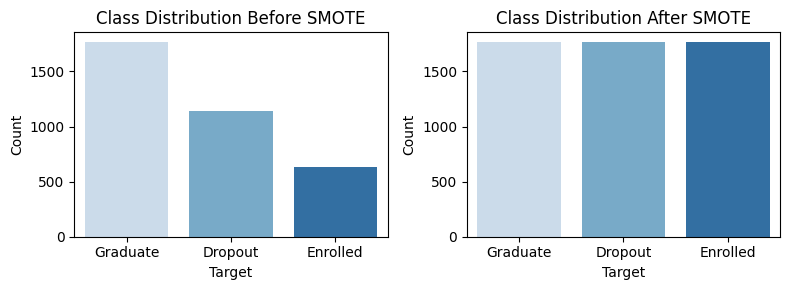

In [15]:
# Assuming y_train is a DataFrame with one column "Target"
y_train_series = y_train_selected.iloc[:, 0]
y_train_resampled_series = y_train_resampled.iloc[:, 0]

# Visualize class distribution before and after SMOTE
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 3))

# Before SMOTE
sns.countplot(x=y_train_series, ax=ax1, hue=y_train_series, palette='Blues')
ax1.set_title('Class Distribution Before SMOTE')
ax1.set_xlabel('Target')
ax1.set_ylabel('Count')

# After SMOTE
sns.countplot(x=y_train_resampled_series, ax=ax2, hue=y_train_resampled_series, palette='Blues')
ax2.set_title('Class Distribution After SMOTE')
ax2.set_xlabel('Target')
ax2.set_ylabel('Count')

plt.tight_layout()
plt.show()


In [16]:
# Store the resampled data for later use
train_resampled = pd.DataFrame(X_train_resampled, columns=X_selected.columns)   # convert back to dataframe
train_resampled['Target'] = y_train_resampled                          # add target column

## Step 5 - Model Training After Bias Mitigation

In [17]:
# Import necessary libraries
from sklearn.model_selection import  KFold

# Define the 5-fold cross validation
kfold = KFold(n_splits=5, shuffle=True, random_state=42)

In [18]:
# Apply cross validation to all models
models = {
    'Random Forest': RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42),
    'Logistic Regression': LogisticRegression(solver='lbfgs', max_iter=1000)
}

# Store results for each model
cv_results = {}

In [19]:
for name, model in models.items():
    print(f"\n{'-'*20} {name} {'-'*20}")
    metrics = cross_validate_model(model, X_train_resampled, y_train_resampled, X_test_scaled, y_test_selected)
    cv_results[name] = metrics
    
    # Print aggregated results
    print(f"\nAggregated Results:")
    print(f"Validation Accuracy: {metrics['accuracy'].mean():.4f} (+/- {metrics['accuracy'].std() * 2:.4f})")
    print(f"Test Accuracy: {metrics['test_accuracy'].mean():.4f} (+/- {metrics['test_accuracy'].std() * 2:.4f})")
    print(f"Precision: {np.mean(metrics['precision']):.4f} (+/- {np.std(metrics['precision']) * 2:.4f})")
    print(f"Recall: {np.mean(metrics['recall']):.4f} (+/- {np.std(metrics['recall']) * 2:.4f})")
    print(f"F1-score: {np.mean(metrics['f1']):.4f} (+/- {np.std(metrics['f1']) * 2:.4f})")



-------------------- Random Forest --------------------

Fold-wise performance:
--------------------------------------------------
Fold 1:
  Validation Accuracy: 0.7983
  Test Accuracy: 0.7424
Fold 2:
  Validation Accuracy: 0.8038
  Test Accuracy: 0.7492
Fold 3:
  Validation Accuracy: 0.7943
  Test Accuracy: 0.7503
Fold 4:
  Validation Accuracy: 0.7830
  Test Accuracy: 0.7492
Fold 5:
  Validation Accuracy: 0.8085
  Test Accuracy: 0.7401

Aggregated Results:
Validation Accuracy: 0.7976 (+/- 0.0174)
Test Accuracy: 0.7462 (+/- 0.0083)
Precision: 0.8051 (+/- 0.0184)
Recall: 0.7976 (+/- 0.0174)
F1-score: 0.7978 (+/- 0.0185)

-------------------- Gradient Boosting --------------------

Fold-wise performance:
--------------------------------------------------
Fold 1:
  Validation Accuracy: 0.8115
  Test Accuracy: 0.7458
Fold 2:
  Validation Accuracy: 0.8255
  Test Accuracy: 0.7469
Fold 3:
  Validation Accuracy: 0.8189
  Test Accuracy: 0.7582
Fold 4:
  Validation Accuracy: 0.7849
  Test Accur

In [25]:
# Add appropriate explainability to your model.
# Provide both local and global explanations. 

import shap
# Use the best performing model from previous step, e.g., xgboost
best_model = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)
best_model.fit(X_train_resampled, y_train_resampled)


,loss,'log_loss'
,learning_rate,0.1
,n_estimators,100
,subsample,1.0
,criterion,'friedman_mse'
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_depth,5
,min_impurity_decrease,0.0
,init,None


In [29]:
# Explain with SHAP
explainer = shap.Explainer(best_model.predict_proba, X_train_resampled)
shap_values = explainer(X_test_selected)

PermutationExplainer explainer: 886it [01:53,  7.14it/s]                         


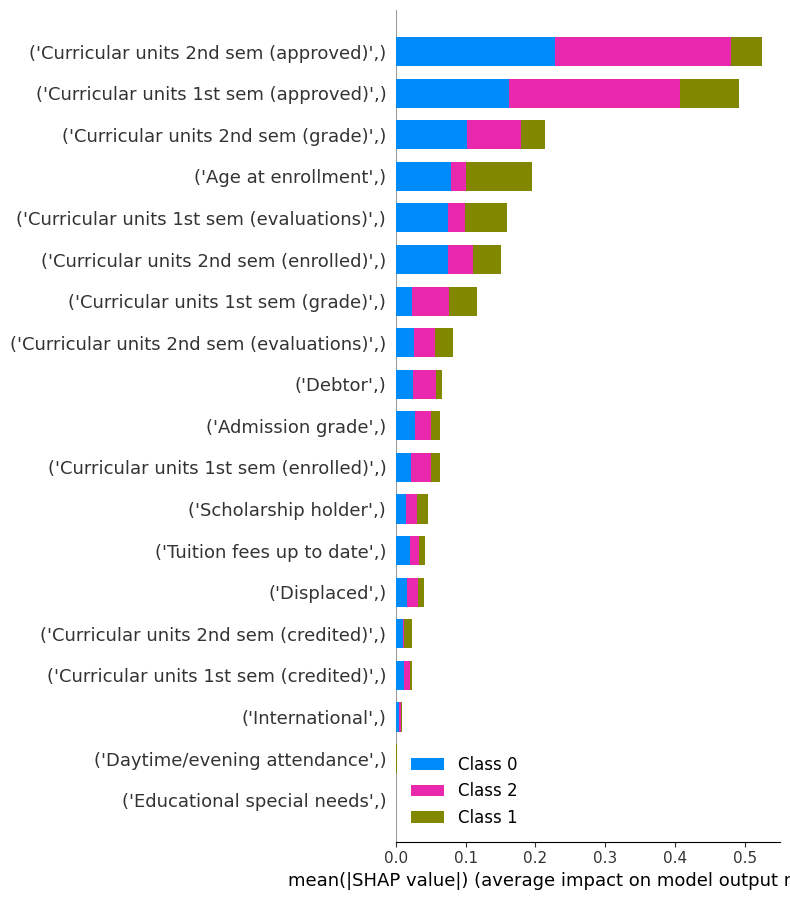

In [30]:
# Visualize SHAP values
shap.summary_plot(shap_values, X_test_scaled, feature_names=X_selected.columns)

In [56]:
print(type(shap_values))
print(getattr(shap_values, "shape", "no shape"))


<class 'shap._explanation.Explanation'>
(885, 19, 3)


2025-11-03 18:51:10.533 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-11-03 18:51:10.534 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-11-03 18:51:10.535 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
PermutationExplainer explainer: 886it [01:52,  7.16it/s]                         
2025-11-03 18:53:03.339 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-11-03 18:53:03.339 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-11-03 18:53:03.339 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.


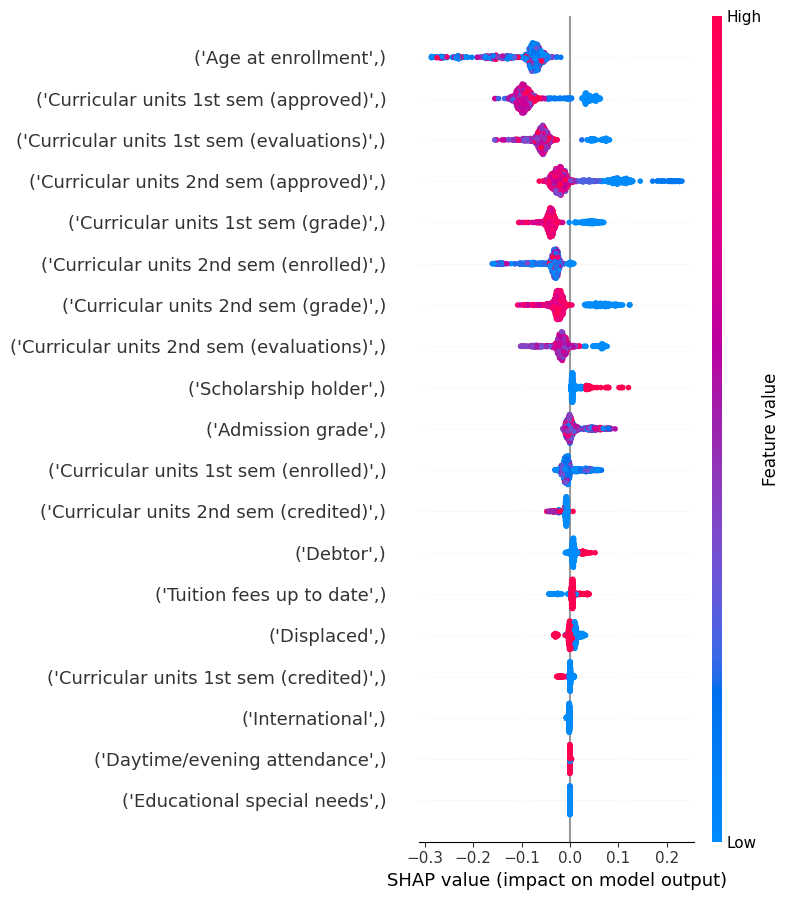

2025-11-03 18:53:03.652 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-11-03 18:53:03.653 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-11-03 18:53:03.653 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-11-03 18:53:03.653 
Calling `st.pyplot()` without providing a figure argument has been deprecated
and will be removed in a later version as it requires the use of Matplotlib's
global figure object, which is not thread-safe.

To future-proof this code, you should pass in a figure as shown below:

```python
fig, ax = plt.subplots()
ax.scatter([1, 2, 3], [1, 2, 3])
# other plotting actions...
st.pyplot(fig)
```

If you have a specific use case that requires this functionality, please let us
know via [issue on Github](https://github.com/streamlit/streamlit/issues).

2025-11-03 18:53:03.654 Thread 'MainThread': mis

<Figure size 640x480 with 0 Axes>

In [63]:
import shap
import streamlit as st

st.title("Student Dropout Model Explainability")

# Works fine with shap.Explainer
explainer = shap.Explainer(best_model.predict_proba, X_train_resampled)
shap_values = explainer(X_test_selected)

# Global importance
st.subheader("Global Feature Importance (Dropout Class)")
st.pyplot(shap.summary_plot(shap_values[..., 1], X_test_selected, feature_names=X_selected.columns, show=True))

# Local explanation
idx = st.slider("Select student index", 0, len(X_test_selected)-1, 0)
st.subheader(f"Local Explanation for Student {idx}")

# Local force plot (no explainer.expected_value)
shap.plots.force(
    shap_values[idx, :, 1],  # single sample
    matplotlib=True
)


In [65]:
import shap
import streamlit as st
import numpy as np

st.title("🎓 Student Dropout Model Explainability")

class_names = ["Graduate", "Dropout", "Enrolled"]

# --- GLOBAL FEATURE IMPORTANCE ---
st.subheader("🌍 Global Feature Importance")

# Check dimensionality
if len(shap_values.shape) == 3:
    num_classes = shap_values.shape[2]
    selected_class_idx = st.selectbox(
        "Select class to visualize:",
        range(num_classes),
        format_func=lambda i: class_names[i] if i < len(class_names) else f"Class {i}"
    )
    shap_data = shap_values.values[..., selected_class_idx]
else:
    # Binary / single-output case
    num_classes = 1
    selected_class_idx = 0
    shap_data = shap_values.values

st.pyplot(shap.summary_plot(
    shap_data,
    X_test_selected,
    feature_names=X_selected.columns,
    show=False
))

# --- LOCAL EXPLANATION ---
st.subheader("👤 Local Explanation for a Single Student")

student_idx = st.slider("Select student index", 0, len(X_test_selected)-1, 0)

if len(shap_values.shape) == 3:
    explanation = shap_values[student_idx, :, selected_class_idx]
else:
    explanation = shap_values[student_idx, :]


2025-11-03 18:57:27.740 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-11-03 18:57:27.741 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-11-03 18:57:27.741 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-11-03 18:57:27.742 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-11-03 18:57:27.742 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-11-03 18:57:27.743 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-11-03 18:57:27.743 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-11-03 18:57:27.743 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bar

In [66]:
st.pyplot(shap.plots.waterfall(explanation, show=False))

IndexError: tuple index out of range

In [67]:
# -------------------------------
# 📘 Student Dropout Explainability
# -------------------------------

import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [68]:
# Assuming you already have:
# best_model, X_train_resampled, X_test_selected, X_selected.columns

# -------------------------------
# 1️⃣ Create SHAP Explainer
# -------------------------------
# For multiclass models, use predict_proba
explainer = shap.Explainer(best_model.predict_proba, X_train_resampled)

# Compute SHAP values for test data
shap_values = explainer(X_test_selected)

# Confirm shape -> (samples, features, classes)
print("SHAP values shape:", shap_values.shape)
print("Classes:", best_model.classes_)

PermutationExplainer explainer: 886it [01:53,  7.14it/s]                         

SHAP values shape: (885, 19, 3)
Classes: ['Dropout' 'Enrolled' 'Graduate']


In [81]:
X_selected

,Daytime/evening attendance,Admission grade,Displaced,Educational special needs,Debtor,Tuition fees up to date,Scholarship holder,Age at enrollment,International,Curricular units 1st sem (credited),Curricular units 1st sem (enrolled),Curricular units 1st sem (evaluations),Curricular units 1st sem (approved),Curricular units 1st sem (grade),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade)
0,1,127.3,1,0,0,1,0,20,0,0,0,0,0,0.000000,0,0,0,0,0.000000
1,1,142.5,1,0,0,0,0,19,0,0,6,6,6,14.000000,0,6,6,6,13.666667
2,1,124.8,1,0,0,0,0,19,0,0,6,0,0,0.000000,0,6,0,0,0.000000
3,1,119.6,1,0,0,1,0,20,0,0,6,8,6,13.428571,0,6,10,5,12.400000
4,0,141.5,0,0,0,1,0,45,0,0,6,9,5,12.333333,0,6,6,6,13.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4419,1,122.2,0,0,0,1,0,19,0,0,6,7,5,13.600000,0,6,8,5,12.666667
4420,1,119.0,1,0,1,0,0,18,1,0,6,6,6,12.000000,0,6,6,2,11.000000
4421,1,149.5,1,0,0,1,1,30,0,0,7,8,7,14.912500,0,8,9,1,13.500000
4422,1,153.8,1,0,0,1,1,20,0,0,5,5,5,13.800000,0,5,6,5,12.000000



Plotting Global Feature Importance for class: 'Dropout' (index=0)


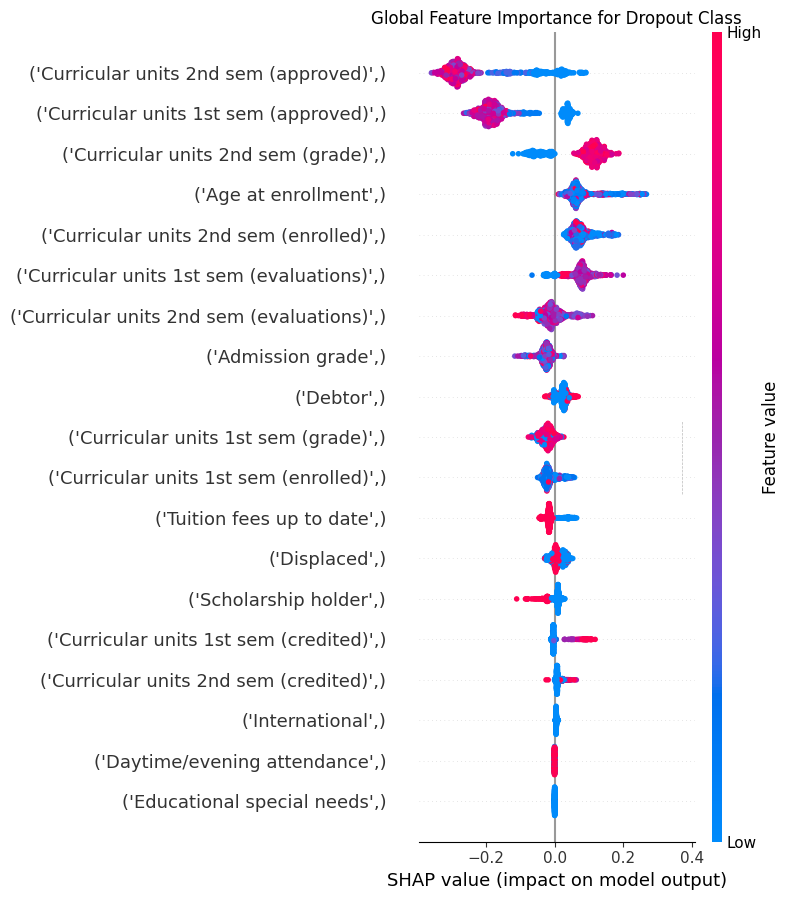

In [69]:
# -------------------------------
# 2️⃣ GLOBAL EXPLANATION
# -------------------------------
# Let's explain for the "Dropout" class (adjust index if needed)
dropout_class_index = list(best_model.classes_).index("Dropout")

print(f"\nPlotting Global Feature Importance for class: 'Dropout' (index={dropout_class_index})")

plt.title("Global Feature Importance for Dropout Class")
shap.summary_plot(
    shap_values[..., dropout_class_index],
    X_test_selected,
    feature_names=X_selected.columns,
    show=True
)
plt.show()

In [71]:
# -------------------------------
# 3️⃣ LOCAL EXPLANATION
# -------------------------------
# Choose one student (row)
idx = 10  # change index to view different students

print(f"\nLocal Explanation for Student Index: {idx}")


Local Explanation for Student Index: 10


In [74]:
shap_values.shape

(885, 19, 3)

In [82]:
dropout_class_index

0

In [79]:
shap_values[idx,:, dropout_class_index]

.values =
array([-4.38652790e-04, -1.36179545e-03,  3.02603525e-02,  1.40966160e-04,
        2.89025908e-02, -1.00757306e-02, -1.55291850e-02,  7.04315937e-02,
        4.78800720e-03,  5.22714539e-02, -3.06002299e-02,  5.18526722e-02,
       -1.91188436e-01, -4.23692017e-02,  4.54463751e-02,  4.61379141e-02,
       -3.40201456e-02, -2.94456786e-01,  1.14951659e-01])

.base_values =
np.float64(0.31723510559119966)

.data =
array([  0.        , 113.5       ,   0.        ,   0.        ,
         0.        ,   1.        ,   1.        ,  50.        ,
         0.        ,   3.        ,   9.        ,  11.        ,
         8.        ,  13.25      ,   2.        ,   7.        ,
         8.        ,   7.        ,  11.71428571])

In [80]:
# Waterfall plot → best for single-sample explanation
shap.plots.waterfall(shap_values[idx, :, dropout_class_index])

IndexError: tuple index out of range

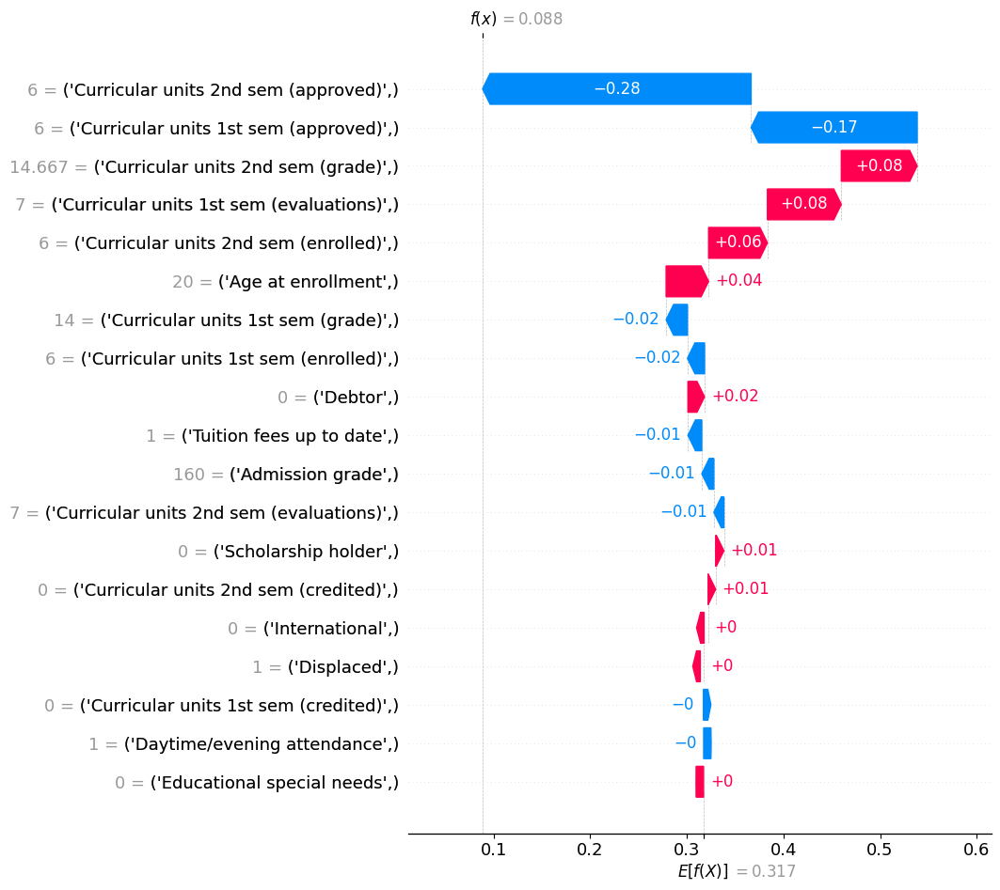

In [84]:
# Choose the dropout class index
dropout_class_index = 0

# Extract SHAP values for dropout class
dropout_shap = shap.Explanation(
    values=shap_values.values[..., dropout_class_index],
    base_values=shap_values.base_values[..., dropout_class_index],
    data=shap_values.data,
    feature_names=X_selected.columns
)

# Pick one sample (student)
idx = 0  # or any student index

# Now plot safely
shap.plots.waterfall(dropout_shap[idx], max_display=len(X_selected.columns))


In [87]:
import shap

# Map class indices
class_names = ["Graduate", "Dropout", "Enrolled"]

# Create SHAP explanation objects per class
shap_explanations = {
    cls: shap.Explanation(
        values=shap_values.values[..., i],
        base_values=shap_values.base_values[..., i],
        data=shap_values.data,
        feature_names=X_selected.columns
    )
    for i, cls in enumerate(class_names)
}


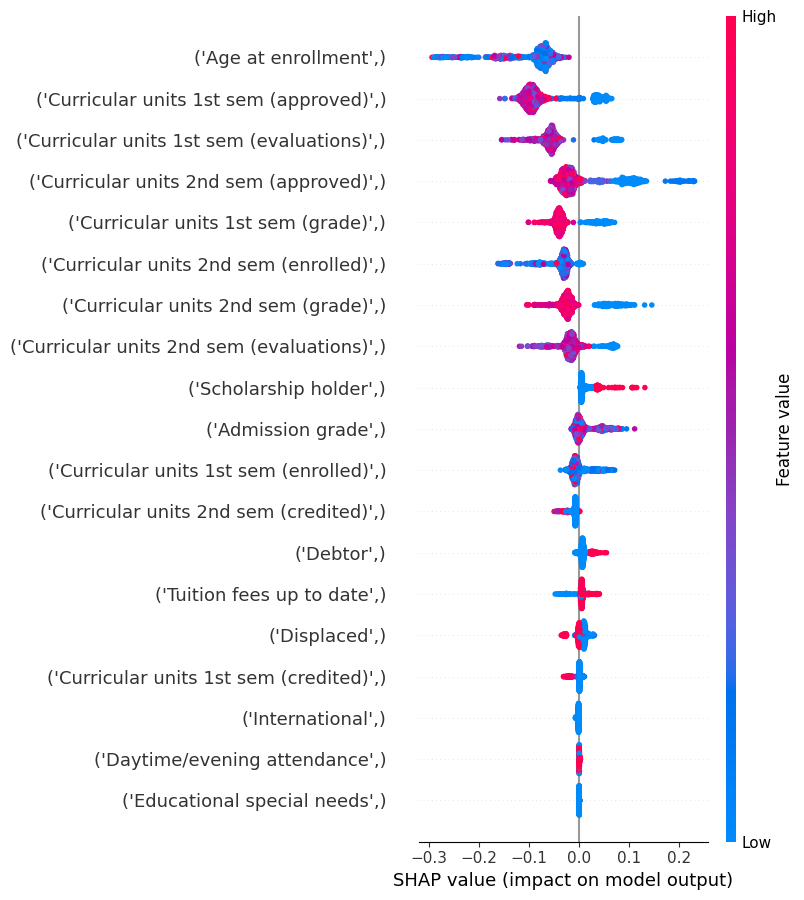

In [89]:
shap.summary_plot(
    shap_explanations["Dropout"].values,
    X_test_selected,
    feature_names=X_selected.columns,
    plot_type="dot"
)

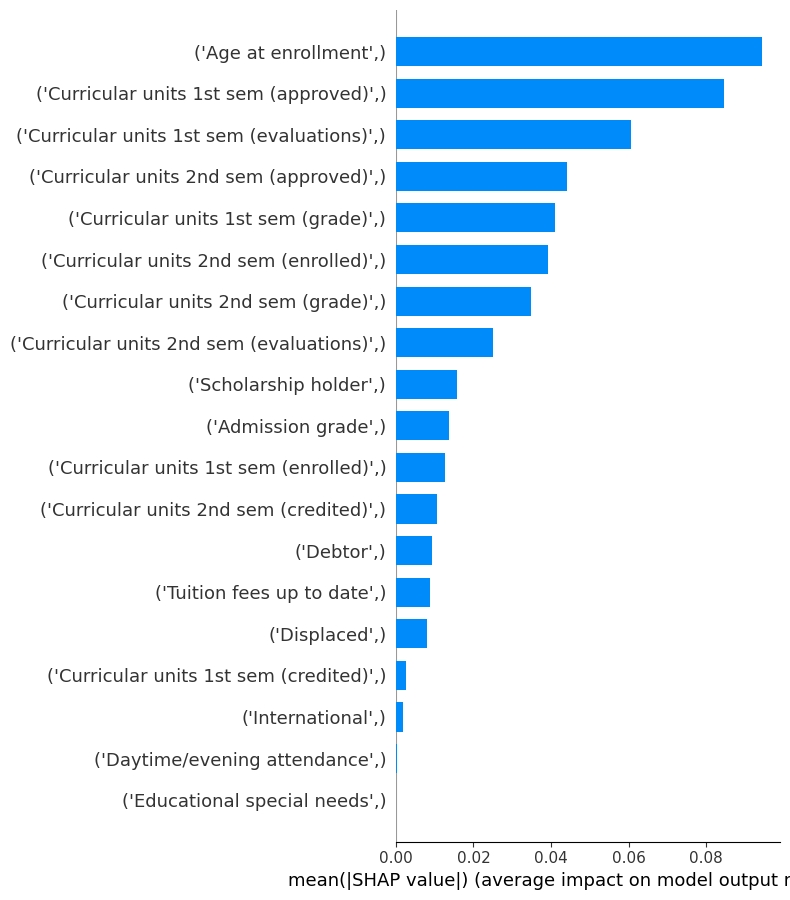

In [90]:
shap.summary_plot(
    shap_explanations["Dropout"].values,
    X_test_selected,
    feature_names=X_selected.columns,
    plot_type="bar"
)

In [ ]:
# Explain with SHAP
explainer = shap.Explainer(best_model.predict_proba, X_train_resampled)
shap_values = explainer(X_test_selected)

PermutationExplainer explainer: 886it [01:53,  7.14it/s]                         


In [ ]:
# Explain with SHAP
explainer = shap.Explainer(best_model.predict_proba, X_train_resampled)
shap_values = explainer(X_test_selected)

PermutationExplainer explainer: 886it [01:53,  7.14it/s]                         


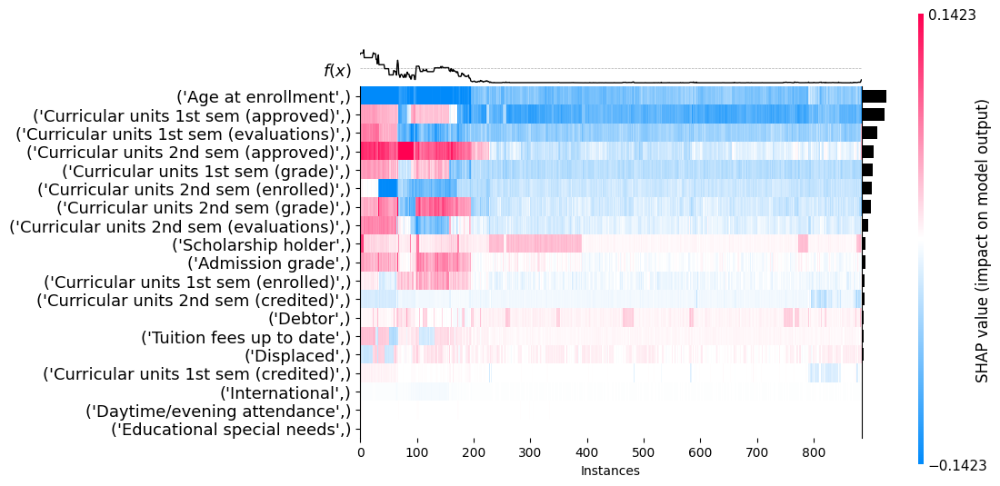

<Axes: xlabel='Instances'>

In [88]:
shap.plots.heatmap(shap_explanations["Dropout"], max_display=19)

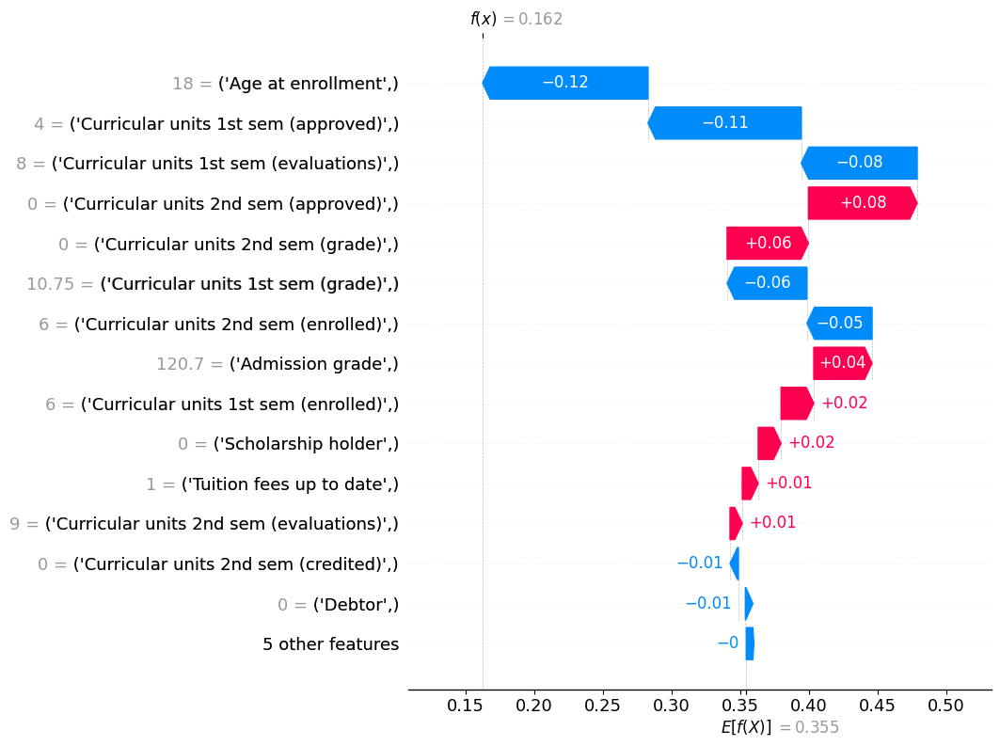

In [92]:
idx = 2  # student index
shap.plots.waterfall(shap_explanations["Dropout"][idx], max_display=15)

In [93]:
shap.initjs()
shap.force_plot(
    shap_explanations["Dropout"].base_values[idx],
    shap_explanations["Dropout"].values[idx],
    X_test_selected.iloc[idx],
    feature_names=X_selected.columns
)


In [103]:
feature_name = "Admission grade"  # Replace with a valid column name from your dataset

X_selected.columns.get_loc(feature_name)


array([False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False])

In [110]:
import shap
import matplotlib.pyplot as plt

# Choose the class and feature to visualize
dropout_class_index = 0
feature_name = "Admission grade"  # Replace with a valid column name from your dataset

shap.plots.scatter(shap_values[..., dropout_class_index][:, X_selected.columns.get_loc(feature_name)])

IndexError: tuple index out of range

In [115]:
import shap
import matplotlib.pyplot as plt

dropout_class_index = 1  # Class 1 = Dropout
feature_name = "Admission grade"  # Feature you want to visualize

# Create a scatter plot for one feature
# Check if shap_values has the expected shape
if len(shap_values.shape) == 3:
    # Extract the SHAP values for the dropout class
    dropout_shap_values = shap_values[..., dropout_class_index]
    feature_index = X_selected.columns.get_loc(feature_name)
    
    # Create a scatter plot for the specified feature
    shap.plots.scatter(
        dropout_shap_values[:, feature_index],
        color=dropout_shap_values[:, X_selected.columns.get_loc("CGPA")],
        feature_names=X_selected.columns
    )
else:
    raise ValueError("shap_values does not have the expected shape. Please verify the input.")


IndexError: tuple index out of range

In [96]:
# Extract the per-class explanation
cls = "Dropout"
exp = shap_explanations[cls]

In [99]:
# ✅ Correct decision plot syntax
shap.plots.decision(
    exp[idx],                  # single student's SHAP values
    features=X_test_selected.iloc[idx],
    feature_names=X_selected.columns
)

TypeError: decision() missing 1 required positional argument: 'shap_values'

In [98]:
# Compare first 5 students for Dropout class
sample_idx = [0, 1, 2, 3, 4]
shap.plots.decision(
    exp.values[sample_idx],
    base_value=exp.base_values[sample_idx],
    features=X_test_selected.iloc[sample_idx],
    feature_names=X_selected.columns
)


TypeError: decision() got multiple values for argument 'base_value'


📘 Local explanation for Graduate:


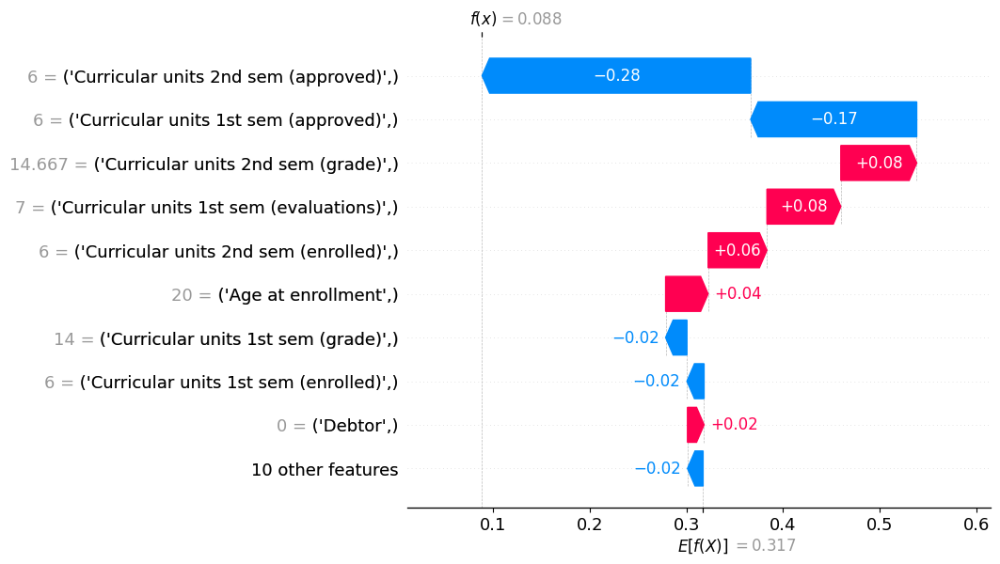


📘 Local explanation for Dropout:


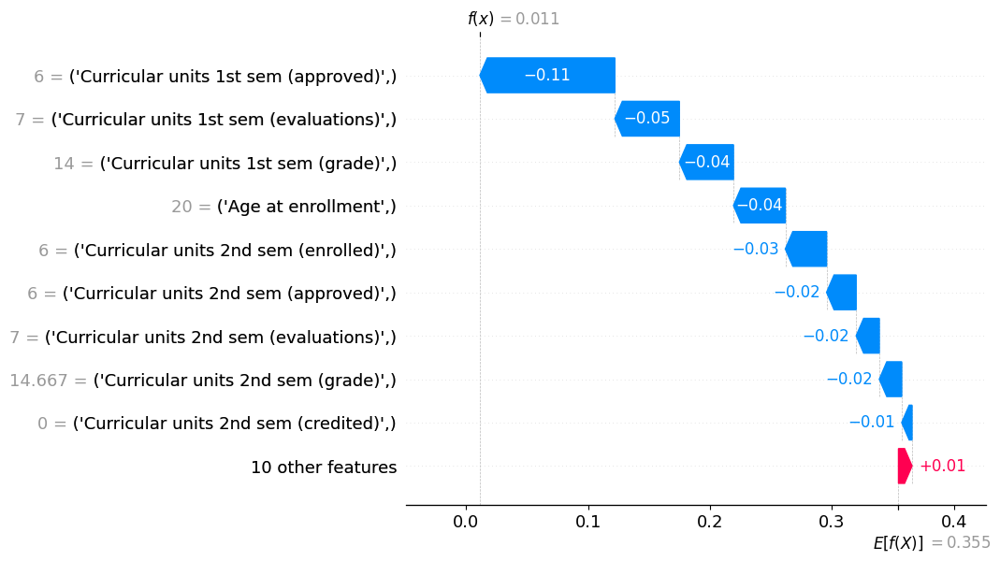


📘 Local explanation for Enrolled:


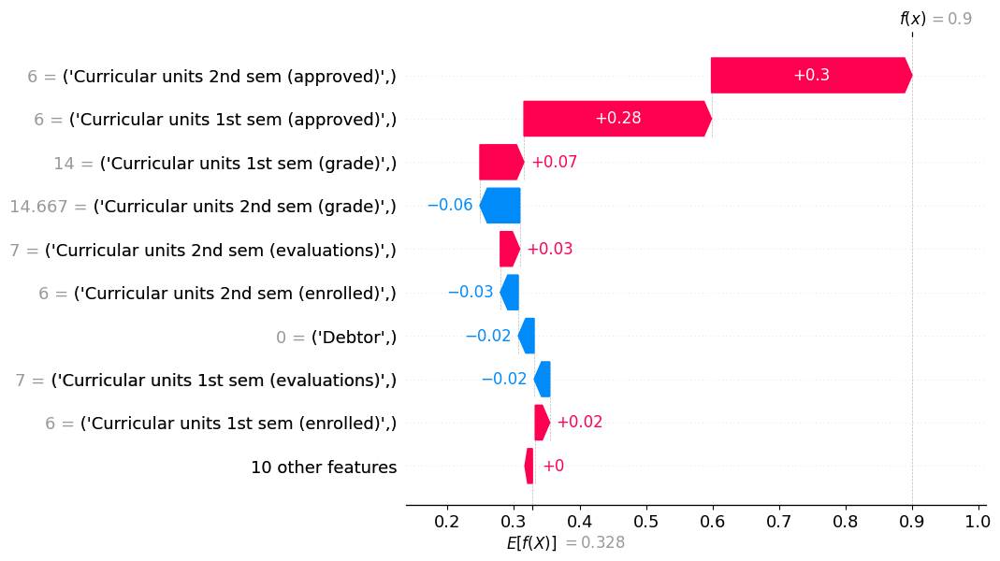

In [95]:
idx = 0
for cls in class_names:
    print(f"\n📘 Local explanation for {cls}:")
    shap.plots.waterfall(shap_explanations[cls][idx], max_display=10)


shap_values type: <class 'shap._explanation.Explanation'>
shap_values.shape attribute (if exists): (885, 19, 3)
shap_values.values.shape: (885, 19, 3)
X_test_selected.shape: (885, 19)
Feature names in DataFrame: [('Daytime/evening attendance',), ('Admission grade',), ('Displaced',), ('Educational special needs',), ('Debtor',), ('Tuition fees up to date',), ('Scholarship holder',), ('Age at enrollment',), ('International',), ('Curricular units 1st sem (credited)',)] ...


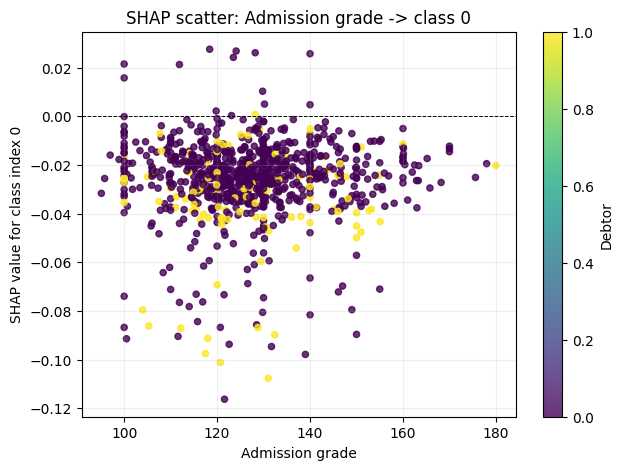

In [116]:
import shap
import numpy as np
import matplotlib.pyplot as plt

# --- Assumptions (adjust names if different) ---
# shap_values : shap._explanation.Explanation with shape (n_samples, n_features, n_classes)
# X_test_selected : pandas.DataFrame with the same columns used for shap computation
# class_names (optional) : list of class names
# e.g. class_names = ["Graduate","Dropout","Enrolled"]

# Put your variables here (they should already exist)
# shap_values, X_test_selected, class_names

# ---------- Helper & diagnostics ----------
print("shap_values type:", type(shap_values))
print("shap_values.shape attribute (if exists):", getattr(shap_values, "shape", None))
print("shap_values.values.shape:", shap_values.values.shape)   # actual numpy array shape
print("X_test_selected.shape:", X_test_selected.shape)
print("Feature names in DataFrame:", list(X_test_selected.columns[:10]), "...")

# Choose class and features to plot
class_idx = 0                       # e.g. 1 -> 'Dropout'
feature_to_plot = "Admission grade"      # change to a real column from X_test_selected
color_by_feature = "Debtor"           # optional, can be None

# ---------- Validate and get indices ----------
# Ensure feature exists in DataFrame
if feature_to_plot not in X_test_selected.columns:
    raise KeyError(f"Feature '{feature_to_plot}' not found in X_test_selected.columns")

if color_by_feature is not None and color_by_feature not in X_test_selected.columns:
    raise KeyError(f"Color-by feature '{color_by_feature}' not found in X_test_selected.columns")

# Get integer indices for features
feat_idx = X_test_selected.columns.get_loc(feature_to_plot)
color_idx = X_test_selected.columns.get_loc(color_by_feature) if color_by_feature is not None else None

# Extract SHAP values for chosen class
# shap_values.values shape is (n_samples, n_features, n_classes) for your case
vals = shap_values.values  # numpy array

if vals.ndim == 3:
    # safe slicing
    shap_for_class = vals[..., class_idx]         # shape (n_samples, n_features)
elif vals.ndim == 2:
    # single-output case (no classes)
    shap_for_class = vals                          # shape (n_samples, n_features)
else:
    raise ValueError("Unexpected shap_values.values ndim = {}".format(vals.ndim))

# Finally get the arrays to plot
y = shap_for_class[:, feat_idx]                    # SHAP values (y-axis)
x = X_test_selected.iloc[:, feat_idx].values      # Actual feature values (x-axis)
c = X_test_selected.iloc[:, color_idx].values if color_idx is not None else None

# ---------- Plotting ----------
plt.figure(figsize=(7,5))
sc = plt.scatter(x, y, c=c, cmap="viridis", s=20, alpha=0.8)
plt.axhline(0, color="k", linewidth=0.7, linestyle="--")
plt.xlabel(feature_to_plot)
plt.ylabel(f"SHAP value for class index {class_idx}")
plt.title(f"SHAP scatter: {feature_to_plot} -> class {class_idx}")
if c is not None:
    cbar = plt.colorbar(sc)
    cbar.set_label(color_by_feature)
plt.grid(alpha=0.2)
plt.show()


In [123]:
feature_index = X_test_selected.columns.get_loc(feature_to_plot)
class_shap_values = shap_values[..., dropout_class_index]

In [126]:
feature_index

array([False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False])

In [132]:
X_test_selected.columns

Index([            ('Daytime/evening attendance',),
                              ('Admission grade',),
                                    ('Displaced',),
                    ('Educational special needs',),
                                       ('Debtor',),
                      ('Tuition fees up to date',),
                           ('Scholarship holder',),
                            ('Age at enrollment',),
                                ('International',),
          ('Curricular units 1st sem (credited)',),
          ('Curricular units 1st sem (enrolled)',),
       ('Curricular units 1st sem (evaluations)',),
          ('Curricular units 1st sem (approved)',),
             ('Curricular units 1st sem (grade)',),
          ('Curricular units 2nd sem (credited)',),
          ('Curricular units 2nd sem (enrolled)',),
       ('Curricular units 2nd sem (evaluations)',),
          ('Curricular units 2nd sem (approved)',),
             ('Curricular units 2nd sem (grade)',)],
      dtype

In [138]:
# Flatten column names (convert tuple ('Feature',) → 'Feature')
X_test_selected.columns = [col[0] if isinstance(col, tuple) else col for col in X_test_selected.columns]

# Confirm it's fixed
print(X_test_selected.columns.tolist())

['Daytime/evening attendance', 'Admission grade', 'Displaced', 'Educational special needs', 'Debtor', 'Tuition fees up to date', 'Scholarship holder', 'Age at enrollment', 'International', 'Curricular units 1st sem (credited)', 'Curricular units 1st sem (enrolled)', 'Curricular units 1st sem (evaluations)', 'Curricular units 1st sem (approved)', 'Curricular units 1st sem (grade)', 'Curricular units 2nd sem (credited)', 'Curricular units 2nd sem (enrolled)', 'Curricular units 2nd sem (evaluations)', 'Curricular units 2nd sem (approved)', 'Curricular units 2nd sem (grade)']


In [140]:
list(X_test_selected.columns)

['Daytime/evening attendance',
 'Admission grade',
 'Displaced',
 'Educational special needs',
 'Debtor',
 'Tuition fees up to date',
 'Scholarship holder',
 'Age at enrollment',
 'International',
 'Curricular units 1st sem (credited)',
 'Curricular units 1st sem (enrolled)',
 'Curricular units 1st sem (evaluations)',
 'Curricular units 1st sem (approved)',
 'Curricular units 1st sem (grade)',
 'Curricular units 2nd sem (credited)',
 'Curricular units 2nd sem (enrolled)',
 'Curricular units 2nd sem (evaluations)',
 'Curricular units 2nd sem (approved)',
 'Curricular units 2nd sem (grade)']

In [139]:
import shap

# Define which class and features you want
dropout_class_index = 1   # 0 = Graduate, 1 = Dropout, 2 = Enrolled
feature_to_plot = "Admission grade"      # feature on X-axis
color_by_feature = "Debtor"           # feature to color by

# Ensure columns are a normal Index
X_test_selected.columns = list(X_test_selected.columns)

# Get integer column indices (force conversion)
feature_index = int(list(X_test_selected.columns).index(feature_to_plot))
color_index = int(list(X_test_selected.columns).index(color_by_feature))

print("Feature index:", feature_index)
print("Color feature index:", color_index)

# Extract SHAP values for the Dropout class
class_shap_values = shap_values[..., dropout_class_index]

# ✅ Create scatter plot
shap.plots.scatter(
    class_shap_values[:, feature_index],  # SHAP values for chosen feature
    color=class_shap_values[:, color_index],  # color intensity based on another feature
    feature_names=X_test_selected.columns,
    show=True
)


Feature index: 1
Color feature index: 4


IndexError: tuple index out of range

In [ ]:
class_shap_values[:, feature_index],  # SHAP values for the selected feature


In [ ]:
import shap

# Check shape and features
print("Shape of shap_values.values:", shap_values.values.shape)
print("Features:", list(X_test_selected.columns))

# Choose the class to visualize
dropout_class_index = 1   # e.g. 0=Graduate, 1=Dropout, 2=Enrolled

# Choose the feature to plot
feature_to_plot = "Admission grade"     # X-axis
color_by_feature = "Debtor"          # color intensity

# Validate features
if feature_to_plot not in X_test_selected.columns:
    raise KeyError(f"Feature '{feature_to_plot}' not found in X_test_selected.columns")

if color_by_feature not in X_test_selected.columns:
    raise KeyError(f"Color-by feature '{color_by_feature}' not found in X_test_selected.columns")

# Get column indices
feature_index = X_test_selected.columns.get_loc(feature_to_plot)
color_index = X_test_selected.columns.get_loc(color_by_feature)

# Extract class-specific shap values
class_shap_values = shap_values[..., dropout_class_index]

# Create SHAP scatter plot
shap.plots.scatter(
    class_shap_values[:, feature_index],  # SHAP values for the selected feature
    color=class_shap_values[:, color_index],  # color shading
    feature_names=X_test_selected.columns,
    show=True
)


Shape of shap_values.values: (885, 19, 3)
Features: [('Daytime/evening attendance',), ('Admission grade',), ('Displaced',), ('Educational special needs',), ('Debtor',), ('Tuition fees up to date',), ('Scholarship holder',), ('Age at enrollment',), ('International',), ('Curricular units 1st sem (credited)',), ('Curricular units 1st sem (enrolled)',), ('Curricular units 1st sem (evaluations)',), ('Curricular units 1st sem (approved)',), ('Curricular units 1st sem (grade)',), ('Curricular units 2nd sem (credited)',), ('Curricular units 2nd sem (enrolled)',), ('Curricular units 2nd sem (evaluations)',), ('Curricular units 2nd sem (approved)',), ('Curricular units 2nd sem (grade)',)]


KeyError: "Feature '0' not found in X_test_selected.columns"

In [ ]:
shap_values[:, X_test_selected.columns.get_loc(feat), dropout_class_index],


In [141]:
import numpy as np

# Calculate mean |SHAP| importance
mean_abs_shap = np.abs(shap_values[..., dropout_class_index].values).mean(axis=0)
top_features = np.array(X_test_selected.columns)[np.argsort(mean_abs_shap)[-5:][::-1]]

print("Top 5 features:", top_features)

# Plot each
for feat in top_features:
    shap.plots.scatter(
        shap_values[:, X_test_selected.columns.get_loc(feat), dropout_class_index],
        feature_names=X_test_selected.columns,
        show=True
    )


Top 5 features: ['Age at enrollment' 'Curricular units 1st sem (approved)'
 'Curricular units 1st sem (evaluations)'
 'Curricular units 2nd sem (approved)' 'Curricular units 1st sem (grade)']


IndexError: tuple index out of range

In [142]:
top_features

array(['Age at enrollment', 'Curricular units 1st sem (approved)',
       'Curricular units 1st sem (evaluations)',
       'Curricular units 2nd sem (approved)',
       'Curricular units 1st sem (grade)'], dtype=object)